<a href="https://colab.research.google.com/github/Chirag-kumar-ML/Video-kyc/blob/main/PAN_data_Extraction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

In [ ]:
fig = plt.gcf()

img = cv.imread("/content/drive/My Drive/E-kyc/pan.jpg")

<Figure size 432x288 with 0 Axes>

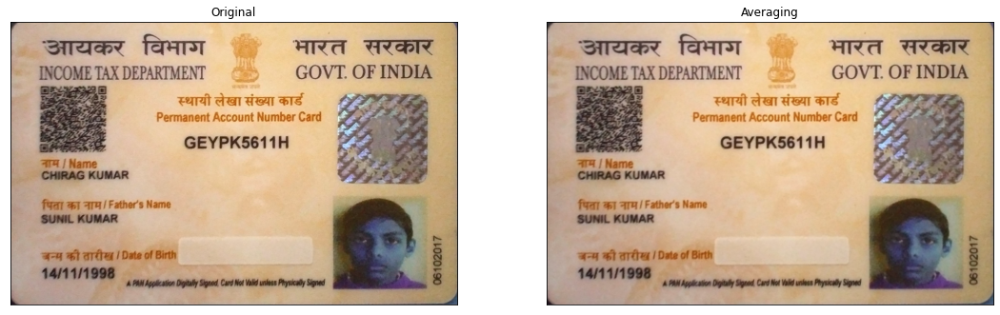

(1481, 2339, 3)

In [ ]:
plt.gcf().set_size_inches(18.5, 10.5)

kernel = np.ones((5,5),np.float32)/25
dst = cv.filter2D(img,-1,kernel)

plt.subplot(121),plt.imshow(img),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(dst),plt.title('Averaging')
plt.xticks([]), plt.yticks([])
plt.show()

img.shape

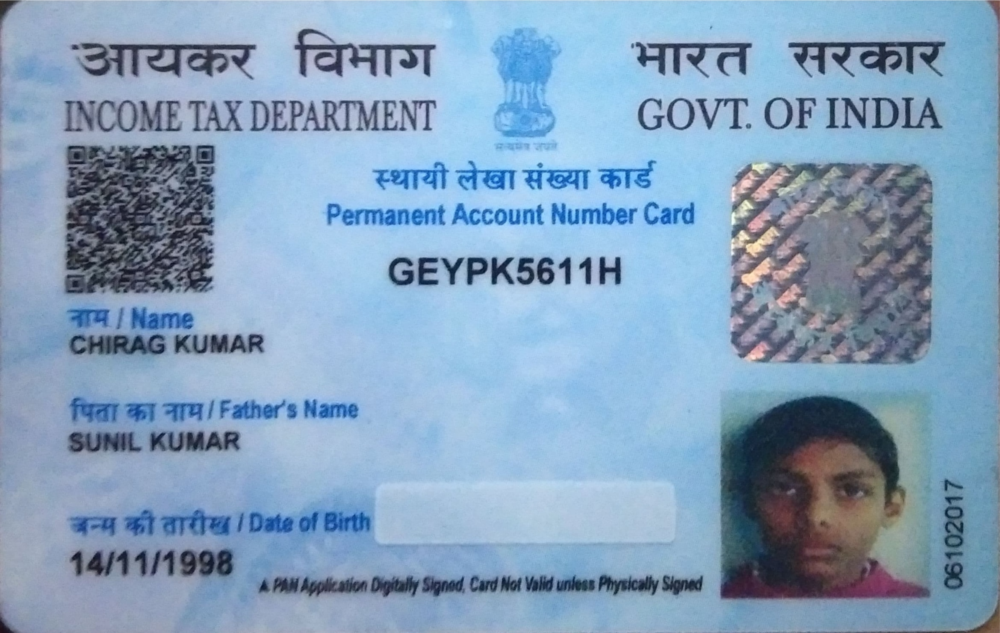

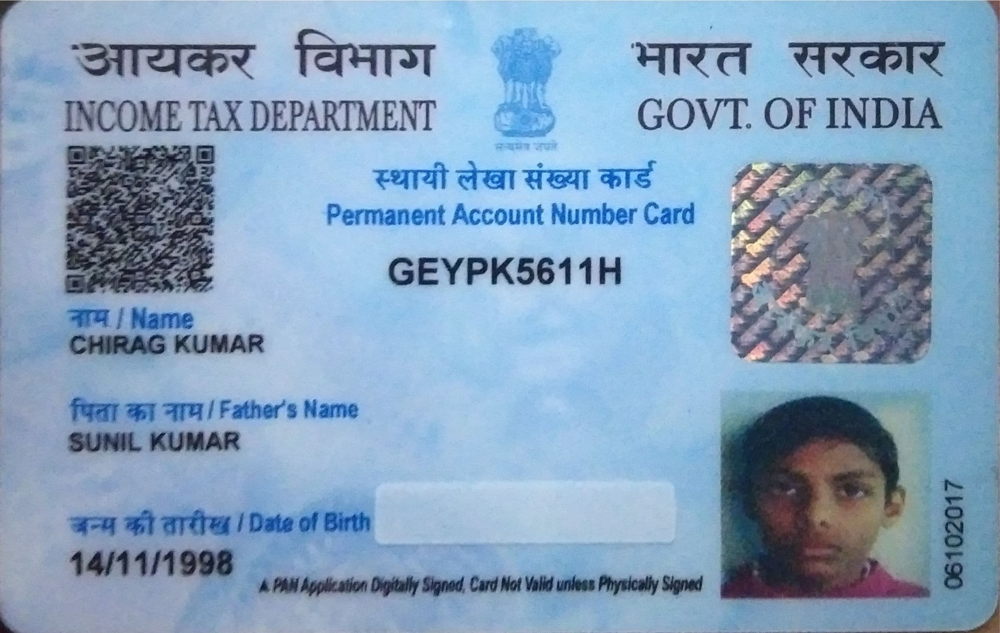

In [ ]:
from google.colab.patches import cv2_imshow
blur = cv.GaussianBlur(img, (5,5), 0)

cv2_imshow(blur)
cv2_imshow(img)

cv.waitKey(0)
cv.destroyAllWindows()

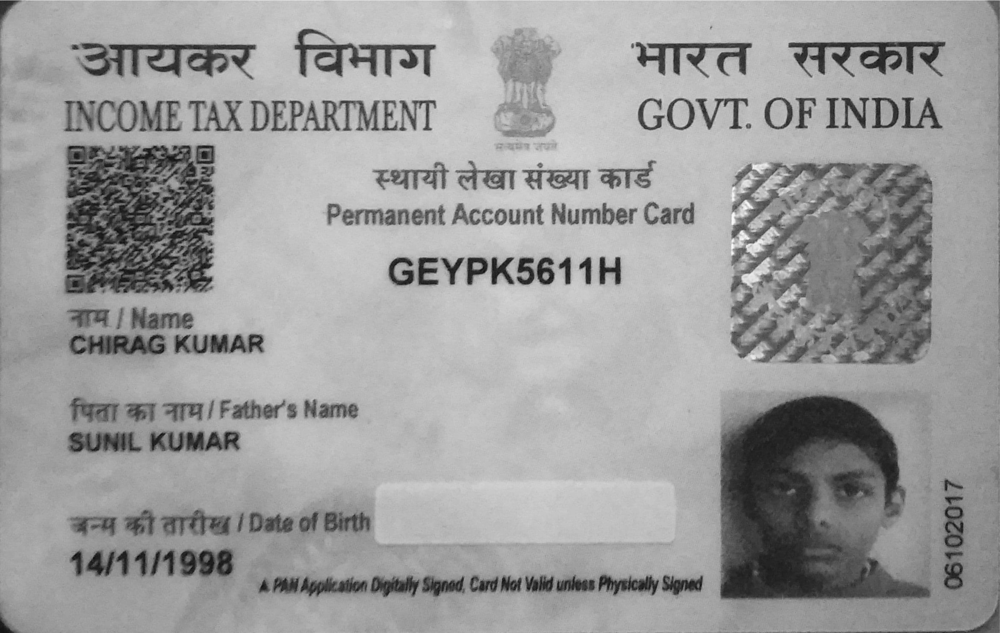

In [ ]:
import cv2
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Display grayscale version
cv2_imshow(gray)

cv2.waitKey(0)
cv2.destroyAllWindows()

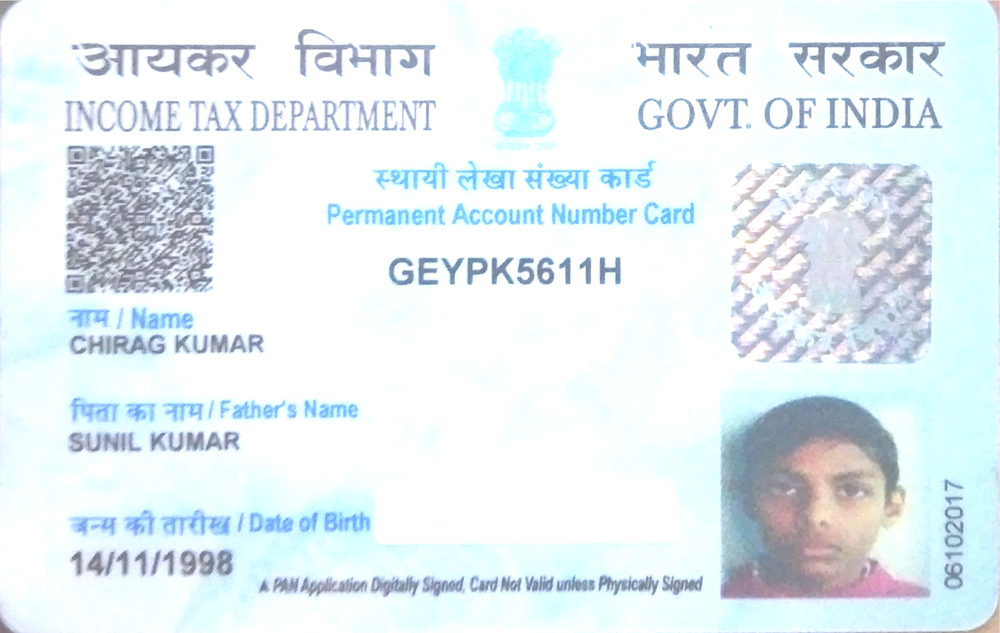

In [ ]:
adjusted_image = np.zeros(img.shape, img.dtype)

alpha = 1.0
beta =100

adjusted_image = cv.convertScaleAbs(img, alpha=alpha, beta=beta)

cv2_imshow(adjusted_image)

cv.waitKey(0)
cv.destroyAllWindows()

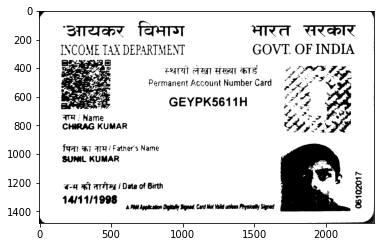

In [ ]:
ret,img_threshold=cv2.threshold(gray,100,255,cv2.THRESH_BINARY)
plt.imshow(img_threshold,'gray')

In [ ]:
!sudo apt install tesseract-ocr

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 14 not upgraded.
Need to get 4,795 kB of archives.
After this operation, 15.8 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-eng all 4.00~git24-0e00fe6-1.2 [1,588 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-osd all 4.00~git24-0e00fe6-1.2 [2,989 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr amd64 4.00~git2288-10f4998a-2 [218 kB]
Fetched 4,795 kB in 1s (4,608 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl

In [ ]:
!pip install pytesseract

  Created wheel for pytesseract: filename=pytesseract-0.3.6-py2.py3-none-any.whl size=13629 sha256=08b0041f2509bf490610c1010e40bc2ab3c2d7aa0cf9ea502e649d79cb313458
  Stored in directory: /root/.cache/pip/wheels/ee/71/72/b98430261d849ae631e283dfc7ccb456a3fb2ed2205714b63f
Successfully built pytesseract


In [ ]:
import pytesseract
import shutil
import os
import random
try:
    from PIL import Image
except ImportError:
    import Image

In [ ]:
extractedInformation = pytesseract.image_to_string(img_threshold)

In [ ]:
print(extractedInformation)

INCOME TAK DEPARTMENT GOVT. OF INDIA

Esqrat ara ST ea} BTS
Parmanent Account Number Card

GEYPK5611H

 

ara / Name
CHIRAG KUMAR

Faar Hl ara / Father's Name
SUNIL KUMAR

4-4 Bt arte | Date of Birth
14/11/1998 '

 

06102017

PAH Agplication Digitally Signed. Card Not Valid uniees Physioolly Signed



In [ ]:
text=extractedInformation

In [ ]:
import re
# Initializing data variable
name = None
fname = None
dob = None
pan = None
nameline = []
dobline = []
panline = []
text0 = []
text1 = []
text2 = []
govRE_str = '(GOVERNMENT|OVERNMENT|VERNMENT|DEPARTMENT|EPARTMENT\
             |PARTMENT|ARTMENT|INDIA|NDIA)$'
numRE_str = '(Number|umber|Account|ccount|count|Permanent|\
             ermanent|manent)$'

# Searching for PAN
lines = text.split('\n')
for lin in lines:
    s = lin.strip()
    s = s.rstrip()
    s = s.lstrip()
    text1.append(s)
print(text1)
text1 = filter(None, text1)
print(text1)
lineno = 0
lis=[]
for element in text1:
  lis.append(element)
print(lis)
for wordline in lis:
  #wordline=wordline.split()
  if([w for w in wordline if re.search(govRE_str, w)]):
    lineno = lis.index(wordline)
    break
text0 = lis[lineno+1:]
print(text0)      


['INCOME TAK DEPARTMENT GOVT. OF INDIA', '', 'Esqrat ara ST ea} BTS', 'Parmanent Account Number Card', '', 'GEYPK5611H', '', '', '', 'ara / Name', 'CHIRAG KUMAR', '', "Faar Hl ara / Father's Name", 'SUNIL KUMAR', '', '4-4 Bt arte | Date of Birth', "14/11/1998 '", '', '', '', '06102017', '', 'PAH Agplication Digitally Signed. Card Not Valid uniees Physioolly Signed', '']
['INCOME TAK DEPARTMENT GOVT. OF INDIA', 'Esqrat ara ST ea} BTS', 'Parmanent Account Number Card', 'GEYPK5611H', 'ara / Name', 'CHIRAG KUMAR', "Faar Hl ara / Father's Name", 'SUNIL KUMAR', '4-4 Bt arte | Date of Birth', "14/11/1998 '", '06102017', 'PAH Agplication Digitally Signed. Card Not Valid uniees Physioolly Signed']
['Esqrat ara ST ea} BTS', 'Parmanent Account Number Card', 'GEYPK5611H', 'ara / Name', 'CHIRAG KUMAR', "Faar Hl ara / Father's Name", 'SUNIL KUMAR', '4-4 Bt arte | Date of Birth', "14/11/1998 '", '06102017', 'PAH Agplication Digitally Signed. Card Not Valid uniees Physioolly Signed']


In [ ]:
import os
import os.path
import json
import sys
import pytesseract
import re
import difflib
import csv
import dateutil.parser as dparser

In [ ]:
with open('/content/drive/My Drive/E-kyc/namedb.csv', 'r') as f:
    read = csv.reader(f)
    newlist = list(read)
newlist = sum(newlist, [])
print(newlist)

['LAHARI', 'NAMRATA', 'HARSHITA', 'PARITOSH', 'SUKHADEVSINH', 'ABDUL', 'ABHIRAM', 'ABOOBACKER', 'ADISHWAR', 'ADITYA', 'AJAY', 'AJAYKUMAR', 'AJIT', 'AKSHADHARAN', 'AKSHAY', 'ALAK', 'ALGIERS', 'ALICE', 'ALOK', 'ALPABEN', 'AMARPREET', 'AMIT', 'AMITA', 'AMITAV', 'AMRUTLAL', 'ANAITA', 'ANAMIKA', 'ANAND', 'ANIL', 'ANIMESH', 'ANIRUDH', 'ANITA', 'ANJALI', 'ANJANKUMAR', 'ANJU', 'ANJULA', 'ANKITA', 'ANNA', 'ANNAPORNA', 'ANOOP', 'ANTONY', 'ANUP', 'ANURAG', 'AQBAL', 'ARCHANA', 'ARIF', 'ARJUNA', 'ARUN', 'ARVIND', 'ARVINDBHAI', 'ASHA', 'ASHISH', 'ASHOK', 'ASHOKKUMAR', 'ASHOO', 'Ashwin', 'ASIAN', 'ASUTOSH', 'ASWINIKUMAR', 'ATMARAM', 'AVINASH', 'AWADHESH', 'BABANRAO', 'BABARAO', 'BABU', 'BABURAYA', 'BAGAVATHI', 'BAISHAKHI', 'BAJRANG', 'BALA', 'BALACHANDRA', 'BALACHANDRAN', 'BALWINDER', 'BASHEER', 'BASHIR', 'BAYANT', 'BEENA', 'BELA', 'BHADRESH', 'BHAGWAN', 'BHAGWANJI', 'BHAGWANTI', 'BHAGWATI', 'BHAGYA', 'Bhakti', 'BHAKTI', 'BHAKUBHAI', 'BHAMINI', 'BHANUBEN', 'BHARAT', 'BHARTI', 'BHAVANA', 'BHAVE', 'BHA

In [ ]:
from dateutil.parser import parse

def is_date(string, fuzzy=False):
    """
    Return whether the string can be interpreted as a date.
"""
    try: 
        parse(string, fuzzy=fuzzy)
        return True

    except ValueError:
        return False
for i in text0:
  if is_date(i)==True:
    dob=i

In [ ]:
name=text0[4]
fname=text0[6]
#dob=text0[8]
pan=text0[2]
# Making tuples of data
data = {}
data['Name'] = name
data['Father Name'] = fname
data['Date of Birth'] = dob
data['PAN'] = pan
print(data)
# # Writing data into JSON
# with open('../result/' + os.path.basename(sys.argv[1]).split('.')[0]
#           + '.json', 'w') as fp:
#     json.dump(data, fp)

{'Name': 'CHIRAG KUMAR', 'Father Name': 'SUNIL KUMAR', 'Date of Birth': "14/11/1998 '", 'PAN': 'GEYPK5611H'}
